In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from tslearn.clustering import TimeSeriesKMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score
from util import inspect_patterns, select_k, train_plot_k, hierarchical_clustering, get_plot_clusters

plt.rcParams.update({'font.size': 10,
                     'axes.titlesize': 'medium',
                     'axes.grid': False})
import pickle

### Load Data

In [3]:
%store -r longterm

In [4]:
longterm = pd.read_csv('data/longterm_combine_site.csv', 
                       usecols = lambda x: 'Unnamed' not in x,
                       parse_dates = ['Start Time'],
                       date_parser = lambda x: pd.to_datetime(x, format = "%H:%M:%S").time())
locations = pd.read_csv('data/locations_combine_site.csv')

C:\Users\Qianhua\AppData\Local\Temp\ipykernel_25200\1175027112.py:1: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  longterm = pd.read_csv('data/longterm_combine_site.csv',


In [5]:
locations.groupby(['Classification'])['site_id'].nunique()

Classification
Non_Trail    61
Trail        82
Name: site_id, dtype: int64

### Calculate Expansion Factor

In [6]:
# 100013837, 100014390 does not have landuse information, remove from the analysis in advance.
longterm = longterm[~longterm.site_id.isin([100013837, 100014390])]

In [7]:
# METHOD 1 - SEPARATE BY YEAR
maht = longterm.groupby(['site_id', 'year', 'month', 'dayofweek', 'Start Time'])['hourly_counts'].mean().unstack(['site_id', 'year', 'month']).T
wat = maht.sum(axis = 1)
mef = maht.div(wat, axis = 0)
threshold = 0.15
flag = mef.gt(threshold).any(axis = 1).values

In [8]:
hour_to_week_expansion_factor = mef[~flag].groupby(['site_id', 'year']).mean()
X = hour_to_week_expansion_factor.to_numpy()
print(X.shape)

(738, 168)


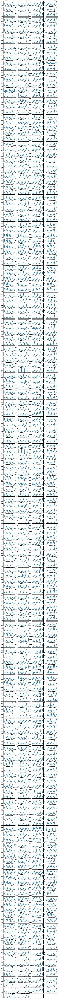

In [9]:
# Plot all records, visually spot outliers
inspect_patterns(hour_to_week_expansion_factor, sharey = False)

### KMeans Clustering
#### Clustering Quality Criteria
- <font color='green'>Inertia</font> - the <font color='green'>lower</font> the better, only consider within group distance
- <font color='green'>Davies Bouldin</font> - the <font color='green'>lower</font> the better 
- <font color='dark orange'>Calinski Harabasz</font> - the <font color='dark orange'>larger</font> the better - consider the ratio between BG / WG distance

- <font color='dark orange'>Silhouette</font> - the <font color='dark orange'>larger</font> the better (A large value means dense and well separated clusters)

<font color='green'>$$Inertia = WGSS$$</font>
<font color='green'>$$DB = \frac{1}{C} \sum_{i=1}^{C} D_i = \frac{1}{C} \sum_{i=1}^{C} \max_{j \ne i} R_{i,j} $$
$$R_{i,j} = \frac{S_i + S_j}{M_{i,j}} $$ </font>
<font color='dark orange'>$$CH = \frac{\frac{BGSS}{K-1}}{\frac{WGSS}{N-K}} = \frac{BGSS}{WGSS} \times \frac{N-K}{K-1} $$</font>
<font color='dark orange'>$$ Silhouette = \frac{1}{N}\sum_{i=1}^{N}\frac{b_i - a_i}{\max{\{a_i, b_i\}}} $$</font>

### 1. Remove outliers

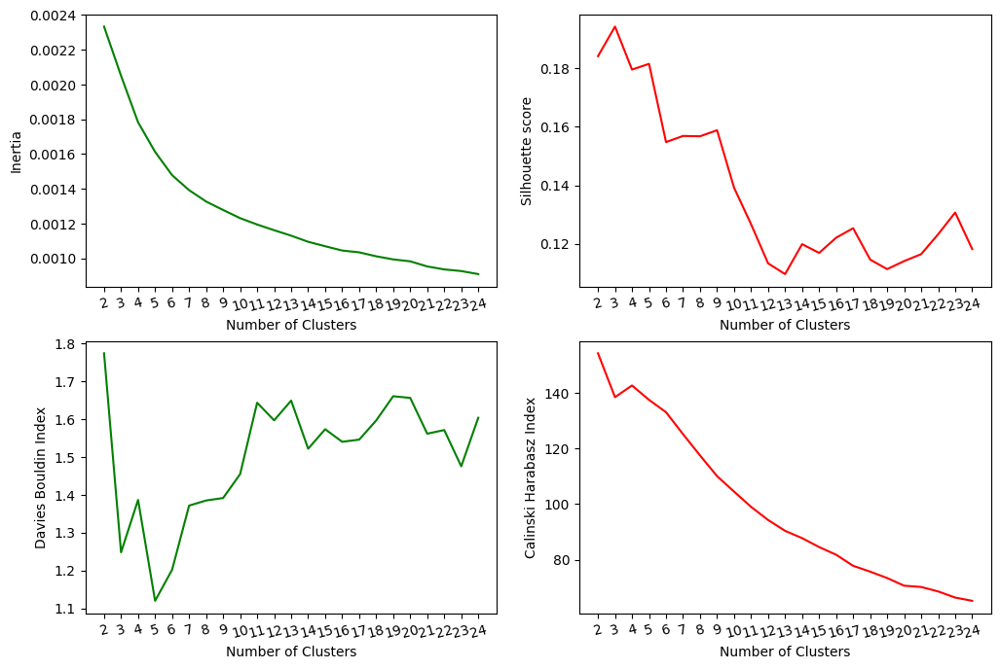

In [12]:
# select number of clusters
# random_state: 
# method 1 = 6, method 2 = 6 / 50
select_k(X, 25, n_init = 30, random_state = 6) 

The Inertia of clustering result is 0.0013, Calinski Harabasz Index is 110.0139, Davies Bouldin Index is 1.3915, Silhouette is 0.1588.


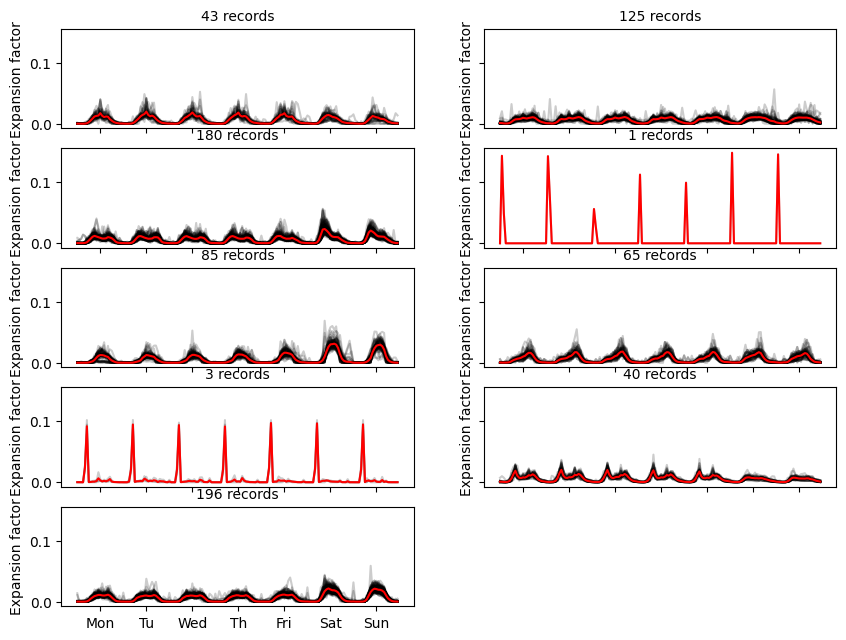

In [13]:
# Check clustering result
K = 9
labels = train_plot_k(X, K, n_init = 30, random_state = 6)

In [14]:
# Treat groups with less than 5 records as a group with outlier pattern
group, gr_sz = np.unique(labels, return_counts = True) # get group labels
subgroup = group[gr_sz >= 5]                           # get labels for group with normal activity patterns
flag = ~np.isin(labels, subgroup)                      # flag abnormal records

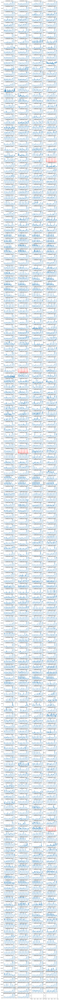

In [15]:
# visualize activity patterns, and flag records identified as outliers 
inspect_patterns(hour_to_week_expansion_factor, flag) 

In [16]:
# Identified extra outliers by eye and further mannually flag them
idx = [47, 64] 
flag[idx] = True

In [17]:
# remove outliers from records
X_sub = X[~flag]
print('{} records are identified as outliers, which leaves {} records'.format(sum(flag), X_sub.shape[0]))

6 records are identified as outliers, which leaves 732 records


### 2. Clustering

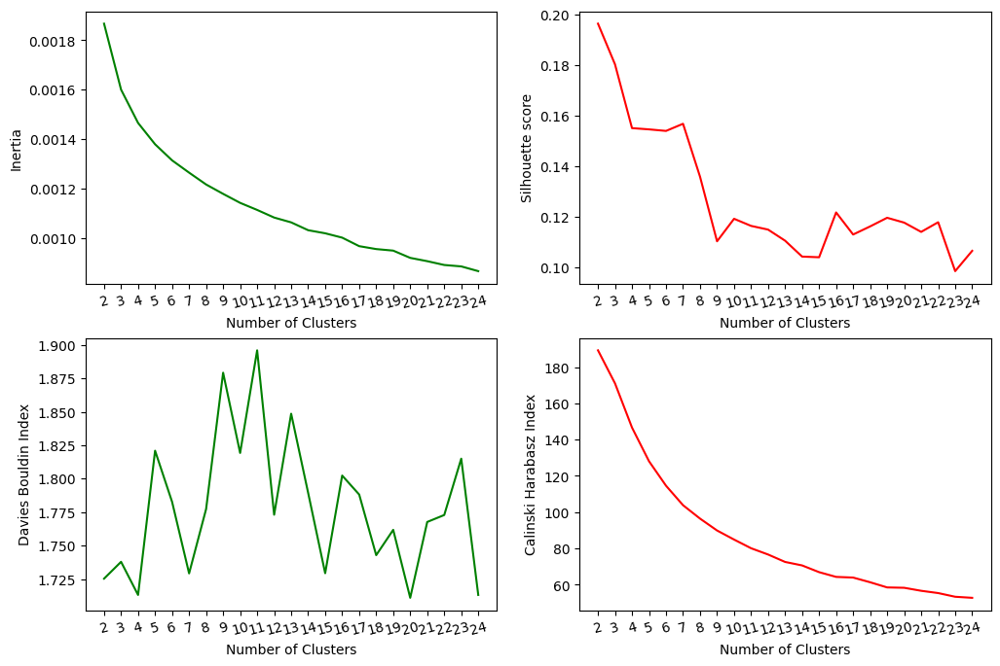

In [18]:
# check clustering criteria
select_k(X_sub, K = 25, n_init = 30, random_state = 6)

The Inertia of clustering result is 0.0013, Calinski Harabasz Index is 103.8560, Davies Bouldin Index is 1.7293, Silhouette is 0.1569.


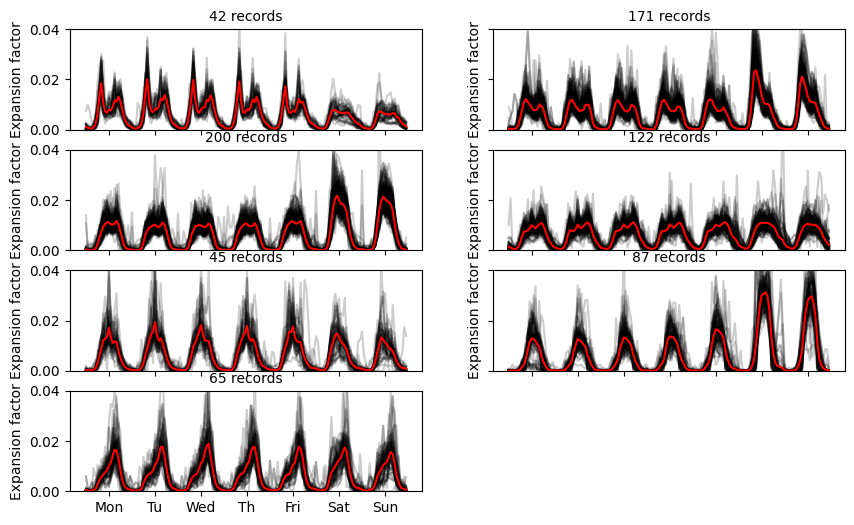

In [19]:
# conduct longitudinal kmeans clustering on clean data
K = 7
labels = train_plot_k(X_sub, K = K, n_init = 30, y_max = .04, random_state = 6)

In [20]:
# save the group expansion factors
hour_to_week_group_expansion_factor = pd.DataFrame(X_sub).groupby(labels).mean().T
hour_to_week_group_expansion_factor.to_csv('data/hour_to_week_group_expansion_factor.csv', index = False)

In [21]:
# save the label
df = hour_to_week_expansion_factor[~flag].reset_index()
df.columns = df.columns.droplevel(1)
label_df = df[['site_id','year']]
label_df['label'] = labels
label_df.to_csv('data/hour_to_week_group.csv', index = False)

C:\Users\Qianhua\AppData\Local\Temp\ipykernel_25200\2176549431.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  label_df['label'] = labels


In [22]:
# inspect how the hour-to-week patterns distributed geographically
locations = locations.merge(label_df, on = 'site_id')
import plotly.express as px

fig = px.scatter_mapbox(locations, 
                        lat = 'latitude', lon = 'longitude', 
                        hover_name = 'site_id', 
                        color = 'label',
                        zoom = 8, height = 600, width = 1600)

fig.update_layout(mapbox_style = 'open-street-map')
fig.show()

C:\Users\Qianhua\AppData\Local\Programs\Python\Python39\lib\site-packages\plotly\express\_core.py:1991: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  group = grouped.get_group(group_name if len(group_name) > 1 else group_name[0])
